### Importação dos dados



In [1]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"

loja = pd.read_csv(url)
loja2 = pd.read_csv(url2)
loja3 = pd.read_csv(url3)
loja4 = pd.read_csv(url4)

loja.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38


In [2]:
loja['Loja'] = 'Loja 1'
loja2['Loja'] = 'Loja 2'
loja3['Loja'] = 'Loja 3'
loja4['Loja'] = 'Loja 4'

In [3]:
lojas_combinadas = pd.concat([loja, loja2, loja3, loja4], ignore_index=True)

In [4]:
lojas_combinadas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9435 entries, 0 to 9434
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Produto                 9435 non-null   object 
 1   Categoria do Produto    9435 non-null   object 
 2   Preço                   9435 non-null   float64
 3   Frete                   9435 non-null   float64
 4   Data da Compra          9435 non-null   object 
 5   Vendedor                9435 non-null   object 
 6   Local da compra         9435 non-null   object 
 7   Avaliação da compra     9435 non-null   int64  
 8   Tipo de pagamento       9435 non-null   object 
 9   Quantidade de parcelas  9435 non-null   int64  
 10  lat                     9435 non-null   float64
 11  lon                     9435 non-null   float64
 12  Loja                    9435 non-null   object 
dtypes: float64(4), int64(2), object(7)
memory usage: 958.4+ KB


In [5]:
lojas_combinadas.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon,Loja
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79,Loja 1
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66,Loja 1
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86,Loja 1
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50,Loja 1
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38,Loja 1


In [6]:
total_vendas_loja_1 = sum(loja['Preço'])
total_vendas_loja_1

1534509.120000001

In [7]:
total_vendas_loja_2 = sum(loja2['Preço'])
total_vendas_loja_2

1488459.059999997

In [8]:
total_vendas_loja_3 = sum(loja3['Preço'])
total_vendas_loja_3

1464025.0300000003

In [9]:
total_vendas_loja_4 = sum(loja4['Preço'])
total_vendas_loja_4

1384497.5800000026

In [10]:
lojas_combinadas['Loja'].value_counts()

,count
Loja,
Loja 1,2359
Loja 2,2359
Loja 3,2359
Loja 4,2358


#1. Análise do faturamento


In [11]:
faturamento_por_loja = lojas_combinadas.groupby('Loja')['Preço'].sum()

In [12]:
faturamento_com_frete = lojas_combinadas.groupby('Loja').apply(
    lambda df: (df['Preço'] + df['Frete']).sum()
)

/tmp/ipython-input-12-4023336345.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  faturamento_com_frete = lojas_combinadas.groupby('Loja').apply(


In [13]:
faturamento_com_frete.sort_values(ascending=False)

,0
Loja,
Loja 1,1.616347e+06
Loja 2,1.567773e+06
Loja 3,1.542048e+06
Loja 4,1.458253e+06


In [14]:
pd.options.display.float_format = '{:,.2f}'.format

In [15]:
faturamento_com_frete.sort_values(ascending=False)

,0
Loja,
Loja 1,"1,616,347.09"
Loja 2,"1,567,773.22"
Loja 3,"1,542,047.69"
Loja 4,"1,458,253.46"


In [16]:
df_faturamento = faturamento_com_frete.reset_index(name='Faturamento Total')

/tmp/ipython-input-17-524048107.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_faturamento = lojas_combinadas.groupby('Loja').apply(


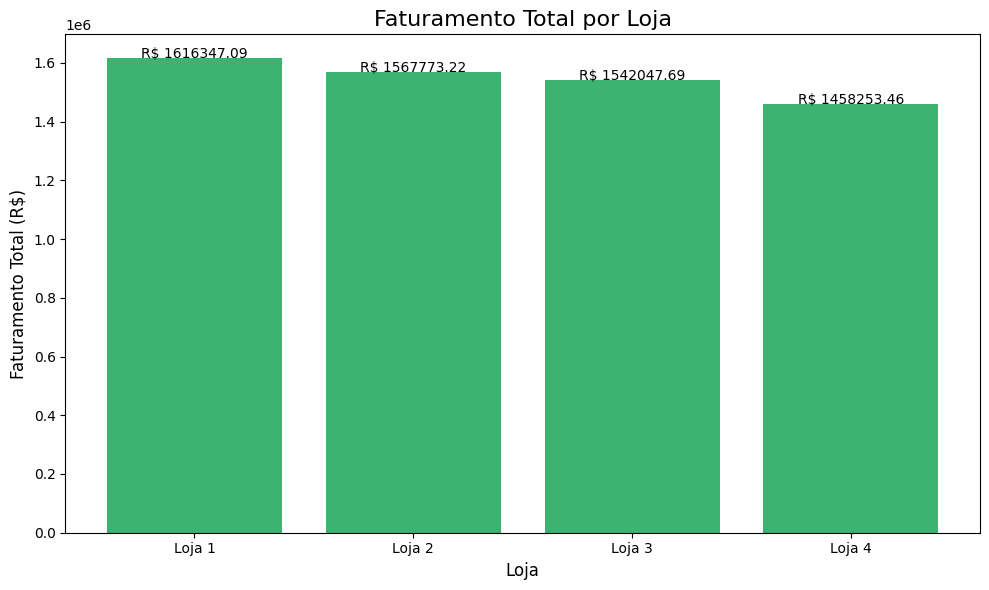

In [17]:
import matplotlib.pyplot as plt

df_faturamento = lojas_combinadas.groupby('Loja').apply(
    lambda df: (df['Preço'] + df['Frete']).sum()
).reset_index(name='Faturamento Total')


plt.figure(figsize=(10, 6))


plt.bar(df_faturamento['Loja'], df_faturamento['Faturamento Total'], color='mediumseagreen')


plt.title('Faturamento Total por Loja', fontsize=16)
plt.xlabel('Loja', fontsize=12)
plt.ylabel('Faturamento Total (R$)', fontsize=12)


for index, row in df_faturamento.iterrows():
    plt.text(index, row['Faturamento Total'] + 50,
             f"R$ {row['Faturamento Total']:.2f}",
             ha='center', fontsize=10)

plt.tight_layout()
plt.show()


# 2. Vendas por Categoria


In [18]:

vendas_categoria = lojas_combinadas.groupby('Categoria do Produto').apply(
    lambda df: (df['Preço'] + df['Frete']).sum()
).reset_index(name='Faturamento Total')

/tmp/ipython-input-18-3198404482.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  vendas_categoria = lojas_combinadas.groupby('Categoria do Produto').apply(


In [19]:
vendas_categoria.sort_values(by='Faturamento Total', ascending=False)

,Categoria do Produto,Faturamento Total
2,eletronicos,"2,332,048.08"
1,eletrodomesticos,"1,860,198.66"
6,moveis,"1,064,149.77"
4,instrumentos musicais,"489,701.48"
3,esporte e lazer,"200,891.94"
0,brinquedos,"103,502.36"
7,utilidades domesticas,"80,921.72"
5,livros,"53,007.43"


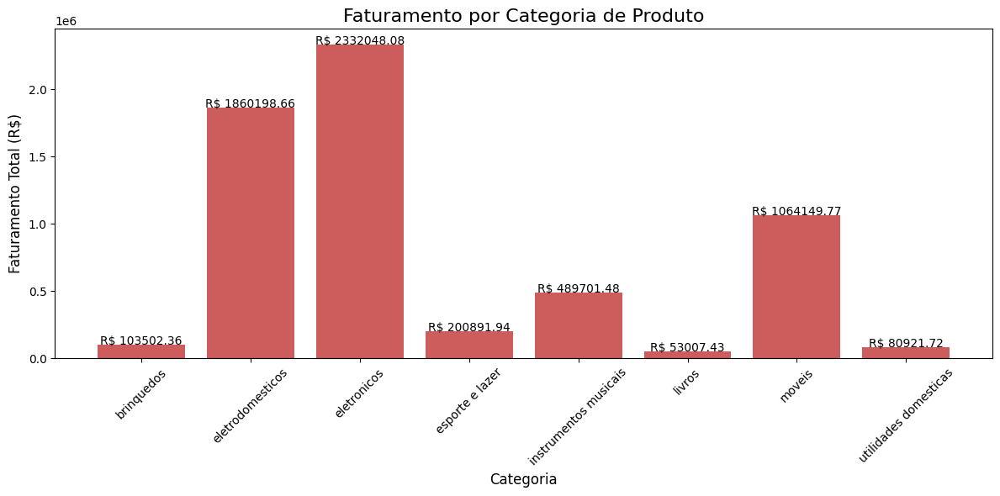

In [20]:
plt.figure(figsize=(12, 6))


plt.bar(vendas_categoria['Categoria do Produto'], vendas_categoria['Faturamento Total'], color='indianred')


plt.title('Faturamento por Categoria de Produto', fontsize=16)
plt.xlabel('Categoria', fontsize=12)
plt.ylabel('Faturamento Total (R$)', fontsize=12)


for index, row in vendas_categoria.iterrows():
    plt.text(index, row['Faturamento Total'] + 50,
             f"R$ {row['Faturamento Total']:.2f}",
             ha='center', fontsize=10)


plt.xticks(rotation=45)


plt.tight_layout()
plt.show()


# 3. Média de Avaliação das Lojas

In [21]:
media_avaliacao_lojas = lojas_combinadas.groupby('Loja')['Avaliação da compra'].mean().reset_index()
media_avaliacao_lojas.columns = ['Loja', 'Média de Avaliação']

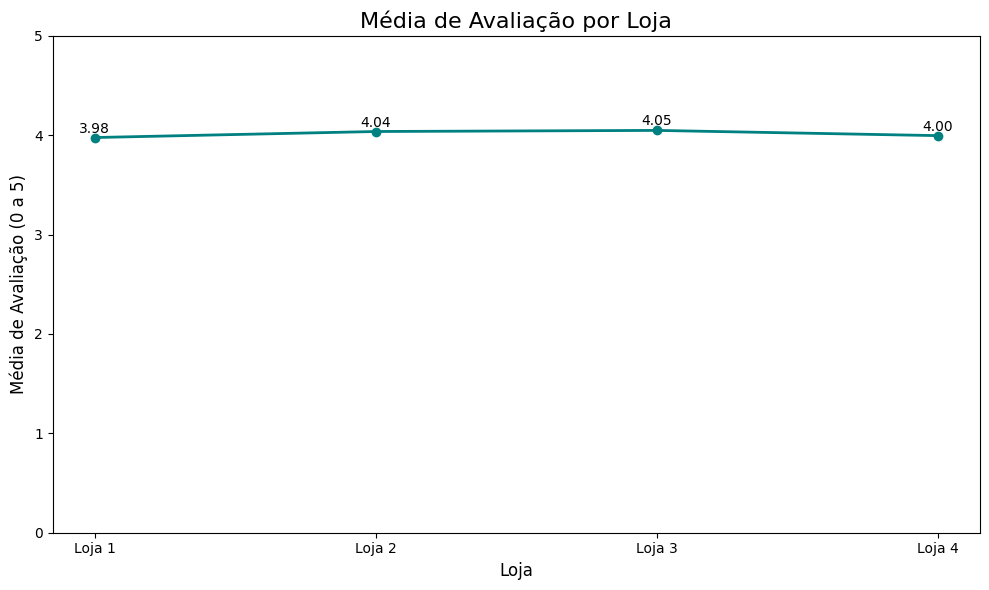

In [22]:
plt.figure(figsize=(10, 6))


plt.plot(
    media_avaliacao_lojas['Loja'],
    media_avaliacao_lojas['Média de Avaliação'],
    marker='o',
    linewidth=2,
    color='teal'
)


plt.title('Média de Avaliação por Loja', fontsize=16)
plt.ylim(0, 5)
plt.ylabel('Média de Avaliação (0 a 5)', fontsize=12)
plt.xlabel('Loja', fontsize=12)


for index, row in media_avaliacao_lojas.iterrows():
    plt.text(index, row['Média de Avaliação'] + 0.05,
             f"{row['Média de Avaliação']:.2f}",
             ha='center', fontsize=10)


plt.tight_layout()
plt.show()


# 4. Produtos Mais e Menos Vendidos

In [23]:
vendas_produto = lojas_combinadas['Produto'].value_counts().reset_index()
vendas_produto.columns = ['Produto', 'Quantidade de Vendas']

In [24]:
mais_vendidos = vendas_produto.head(10)  # Top 10

In [25]:
mais_vendidos.sort_values(by='Quantidade de Vendas', ascending=False)

,Produto,Quantidade de Vendas
0,Cômoda,210
1,Carrinho controle remoto,206
2,Micro-ondas,206
3,Bateria,203
4,Cama king,201
5,Secadora de roupas,200
6,Modelagem preditiva,200
7,Jogo de panelas,200
8,Cama box,199
9,Blocos de montar,199


In [26]:
menos_vendidos = vendas_produto.tail(10)  # 10 menos vendidos

In [27]:
menos_vendidos.sort_values(by='Quantidade de Vendas')

,Produto,Quantidade de Vendas
50,Celular ABXY,157
49,Headset,158
48,Mochila,163
47,Guitarra,165
46,Ciência de dados com python,166
45,Assistente virtual,167
44,Poltrona,168
43,Jogo de copos,169
42,Smartwatch,172
41,Panela de pressão,172


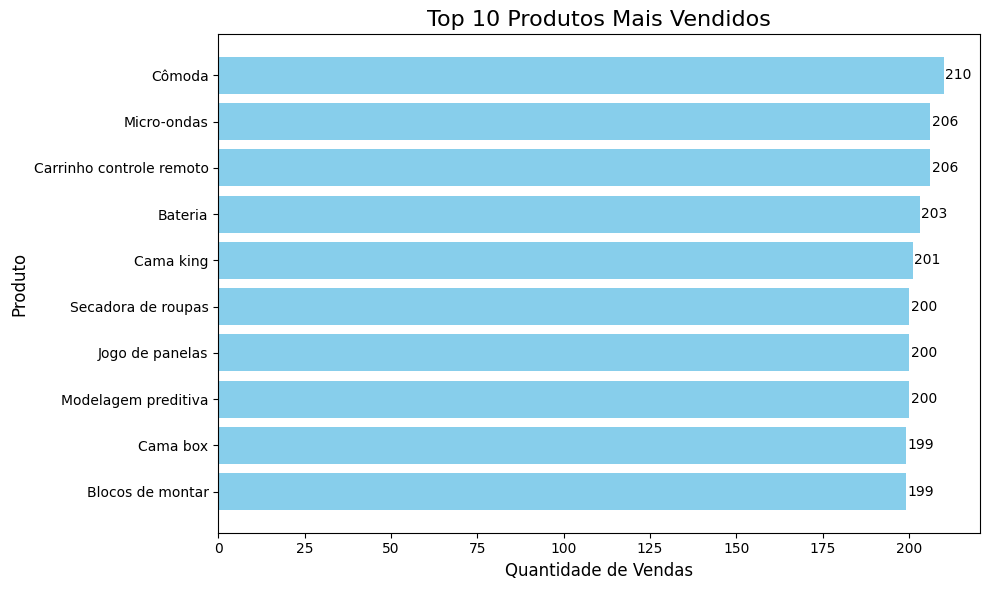

In [28]:
df_mais_vendidos = mais_vendidos.sort_values('Quantidade de Vendas')


plt.figure(figsize=(10, 6))

plt.barh(
    df_mais_vendidos['Produto'],
    df_mais_vendidos['Quantidade de Vendas'],
    color='skyblue'
)

plt.title('Top 10 Produtos Mais Vendidos', fontsize=16)
plt.xlabel('Quantidade de Vendas', fontsize=12)
plt.ylabel('Produto', fontsize=12)

for index, value in enumerate(df_mais_vendidos['Quantidade de Vendas']):
    plt.text(value + 0.5, index, str(value), va='center', fontsize=10)

plt.tight_layout()
plt.show()


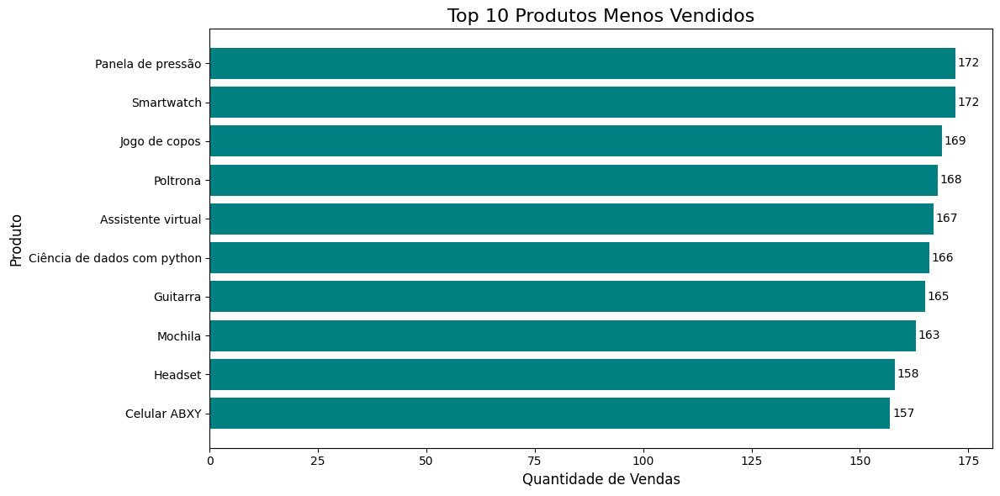

In [29]:
df_menos_vendidos = menos_vendidos.sort_values('Quantidade de Vendas')


plt.figure(figsize=(12, 6))

plt.barh(
    df_menos_vendidos['Produto'],
    df_menos_vendidos['Quantidade de Vendas'],
    color='teal'
)


plt.title('Top 10 Produtos Menos Vendidos', fontsize=16)
plt.xlabel('Quantidade de Vendas', fontsize=12)
plt.ylabel('Produto', fontsize=12)


for index, value in enumerate(df_menos_vendidos['Quantidade de Vendas']):
    plt.text(value + 0.5, index, str(value), va='center', fontsize=10)

plt.tight_layout()
plt.show()


# 5. Frete Médio por Loja


In [30]:
frete_medio_por_loja = lojas_combinadas.groupby('Loja')['Frete'].mean().reset_index()
frete_medio_por_loja.columns = ['Loja', 'Frete Médio']

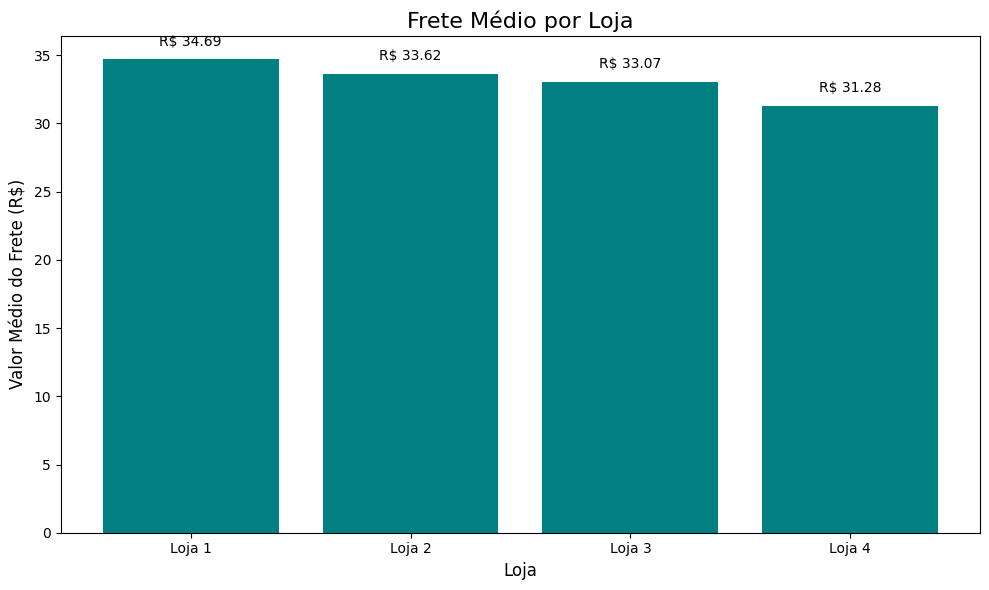

In [31]:
plt.figure(figsize=(10, 6))


plt.bar(
    frete_medio_por_loja['Loja'],
    frete_medio_por_loja['Frete Médio'],
    color='teal'
)


plt.title('Frete Médio por Loja', fontsize=16)
plt.xlabel('Loja', fontsize=12)
plt.ylabel('Valor Médio do Frete (R$)', fontsize=12)

for index, row in frete_medio_por_loja.iterrows():
    plt.text(
        index,
        row['Frete Médio'] + 1,
        f"R$ {row['Frete Médio']:.2f}",
        ha='center',
        fontsize=10
    )

plt.tight_layout()
plt.show()


##6. Extra Análise de Desempenho Geográfico


In [62]:
entregas_distancia = lojas_combinadas[['Preço', 'Local da compra', 'Produto', 'Vendedor', 'Frete', 'lat', 'lon']]


In [63]:
from geopy.distance import geodesic

lat_media = entregas_distancia['lat'].mean()
lon_media = entregas_distancia['lon'].mean()
ponto_referencia = (lat_media, lon_media)


In [64]:
entregas_distancia['Distancia_km'] = entregas_distancia.apply(
    lambda row: geodesic((row['lat'], row['lon']), ponto_referencia).km,
    axis=1
)

print(entregas_distancia)


        Preço Local da compra                Produto        Vendedor  Frete  \
0      219.08              SP     Assistente virtual     Pedro Gomes   9.25   
1      256.35              RJ         Mesa de jantar  Beatriz Moraes  11.23   
2      279.51              DF      Jogo de tabuleiro      João Souza  21.26   
3    1,009.99              RS            Micro-ondas      João Souza  54.67   
4      446.99              MG  Cadeira de escritório   Larissa Alves  26.96   
...       ...             ...                    ...             ...    ...   
9430   303.60              RJ         Mesa de jantar  Camila Ribeiro  16.85   
9431   456.02              PE  Cadeira de escritório   Felipe Santos  24.81   
9432    48.99              SP           Copo térmico  Camila Ribeiro   3.14   
9433   202.45              PR        Jogo de panelas   Bianca Santos  11.06   
9434    14.89              SP         Corda de pular   Felipe Santos   1.73   

        lat    lon  Distancia_km  
0    -22.19 -48.

/tmp/ipython-input-64-2522413781.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  entregas_distancia['Distancia_km'] = entregas_distancia.apply(


In [65]:
entregas_distancia = lojas_combinadas[['Produto','Preço', 'Frete', 'lat', 'lon']].copy()


lat_media = entregas_distancia['lat'].mean()
lon_media = entregas_distancia['lon'].mean()
ponto_referencia = (lat_media, lon_media)

print(f"Ponto de referência: lat {lat_media:.4f}, lon {lon_media:.4f}")


entregas_distancia['Distancia_km'] = entregas_distancia.apply(
    lambda row: geodesic((row['lat'], row['lon']), ponto_referencia).km,
    axis=1
)

print(entregas_distancia)


Ponto de referência: lat -20.5341, lon -47.1712
                    Produto    Preço  Frete    lat    lon  Distancia_km
0        Assistente virtual   219.08   9.25 -22.19 -48.79        248.60
1            Mesa de jantar   256.35  11.23 -22.25 -42.66        504.87
2         Jogo de tabuleiro   279.51  21.26 -15.83 -47.86        525.73
3               Micro-ondas 1,009.99  54.67 -30.17 -53.50      1,242.44
4     Cadeira de escritório   446.99  26.96 -18.10 -44.38        398.27
...                     ...      ...    ...    ...    ...           ...
9430         Mesa de jantar   303.60  16.85 -22.25 -42.66        504.87
9431  Cadeira de escritório   456.02  24.81  -8.38 -37.86      1,676.81
9432           Copo térmico    48.99   3.14 -22.19 -48.79        248.60
9433        Jogo de panelas   202.45  11.06 -24.89 -51.55        659.48
9434         Corda de pular    14.89   1.73 -22.19 -48.79        248.60

[9435 rows x 6 columns]


In [66]:
import folium
from folium.plugins import HeatMap, MarkerCluster


entregas_distancia = pd.DataFrame(entregas_distancia)

entregas_distancia['Produto'] = entregas_distancia['Preço'] + entregas_distancia['Frete']

lat_media = entregas_distancia['lat'].mean()
lon_media = entregas_distancia['lon'].mean()
ponto_ref = (lat_media, lon_media)


entregas_distancia['Distancia_km'] = entregas_distancia.apply(
    lambda row: geodesic((row['lat'], row['lon']), ponto_ref).km,
    axis=1
)


m = folium.Map(location=[lat_media, lon_media], zoom_start=5)


folium.Marker(
    location=[lat_media, lon_media],
    popup="Ponto Médio",
    icon=folium.Icon(color='red', icon='home')
).add_to(m)


heat_data = [[row['lat'], row['lon'], row['Produto']] for index, row in entregas_distancia.iterrows()]
HeatMap(heat_data, radius=25, blur=15, max_zoom=10).add_to(m)


marker_cluster = MarkerCluster().add_to(m)

for _, row in entregas_distancia.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=row['Produto'] / 100,
        popup=(
            f"Produto: {row['Produto']}<br>"
            f"Valor: R${row['Preço']:.2f}<br>"
            f"Distância: {row['Distancia_km']:.2f} km"
        ),
        color='blue',
        fill=True,
        fill_opacity=0.7
    ).add_to(marker_cluster)

m


In [72]:
loja_coords = (lat_media, lon_media)

entregas_distancia['Distancia_km'] = entregas_distancia.apply(lambda row: geodesic((row['lat'], row['lon']), loja_coords).km, axis=1)

print(entregas_distancia[['Produto', 'Preço', 'Distancia_km']])

      Produto    Preço  Distancia_km
0      228.33   219.08        248.60
1      267.58   256.35        504.87
2      300.77   279.51        525.73
3    1,064.66 1,009.99      1,242.44
4      473.95   446.99        398.27
...       ...      ...           ...
9430   320.45   303.60        504.87
9431   480.83   456.02      1,676.81
9432    52.13    48.99        248.60
9433   213.51   202.45        659.48
9434    16.62    14.89        248.60

[9435 rows x 3 columns]


In [73]:
df_junto = pd.concat([entregas_distancia, lojas_combinadas], ignore_index=True)
print(df_junto)

                     Produto    Preço  Frete    lat    lon  Distancia_km  \
0                     228.33   219.08   9.25 -22.19 -48.79        248.60   
1                     267.58   256.35  11.23 -22.25 -42.66        504.87   
2                     300.77   279.51  21.26 -15.83 -47.86        525.73   
3                   1,064.66 1,009.99  54.67 -30.17 -53.50      1,242.44   
4                     473.95   446.99  26.96 -18.10 -44.38        398.27   
...                      ...      ...    ...    ...    ...           ...   
18865         Mesa de jantar   303.60  16.85 -22.25 -42.66           NaN   
18866  Cadeira de escritório   456.02  24.81  -8.38 -37.86           NaN   
18867           Copo térmico    48.99   3.14 -22.19 -48.79           NaN   
18868        Jogo de panelas   202.45  11.06 -24.89 -51.55           NaN   
18869         Corda de pular    14.89   1.73 -22.19 -48.79           NaN   

        Categoria do Produto Data da Compra        Vendedor Local da compra  \
0       

In [82]:
loja_coords = (lat_media, lon_media)

entregas_distancia['Distancia_km'] = entregas_distancia.apply(
    lambda row: geodesic((row['lat'], row['lon']), loja_coords).km,
    axis=1
)

print(entregas_distancia[['Produto', 'Preço', 'Distancia_km']])


      Produto    Preço  Distancia_km
0      228.33   219.08        248.60
1      267.58   256.35        504.87
2      300.77   279.51        525.73
3    1,064.66 1,009.99      1,242.44
4      473.95   446.99        398.27
...       ...      ...           ...
9430   320.45   303.60        504.87
9431   480.83   456.02      1,676.81
9432    52.13    48.99        248.60
9433   213.51   202.45        659.48
9434    16.62    14.89        248.60

[9435 rows x 3 columns]


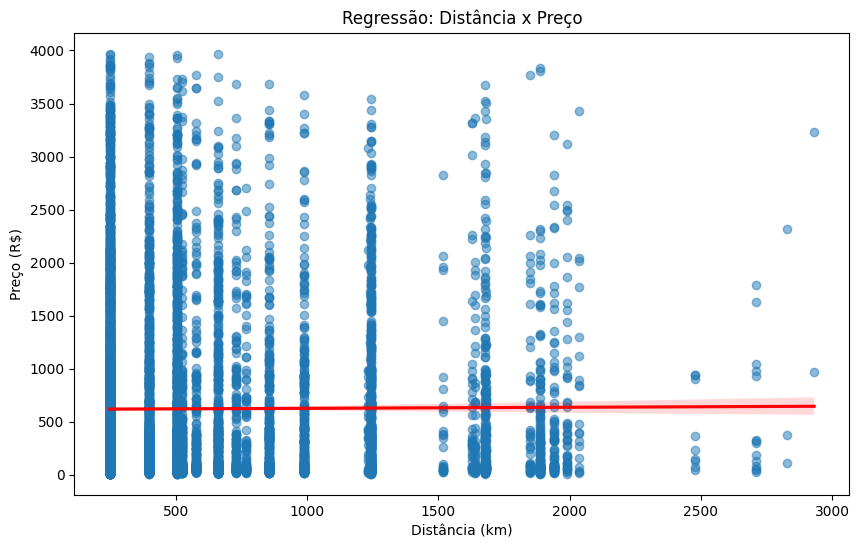

In [83]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.regplot(
    data=entregas_distancia,
    x='Distancia_km',
    y='Preço',
    scatter_kws={'alpha':0.5},
    line_kws={'color':'red'}
)
plt.title('Regressão: Distância x Preço')
plt.xlabel('Distância (km)')
plt.ylabel('Preço (R$)')
plt.show()


In [84]:
import plotly.express as px

fig = px.scatter(
    entregas_distancia,
    x='Distancia_km',
    y='Preço',
    color='Produto',
    hover_data=['Produto', 'Preço', 'Distancia_km'],
    size='Preço',
    title='Relação entre Distância e Preço'
)
fig.show()


In [76]:
corr = entregas_distancia['Distancia_km'].corr(entregas_distancia['Preço'])
print(f'Correlação Distância x Preço: {corr:.2f}')


Correlação Distância x Preço: 0.01


##7. Relatório



## 📉 Por que vender a loja com menor faturamento?

A análise de desempenho da nossa **Alura Store E-commerce** em 2023 mostrou que a **Loja 4**, por exemplo, apresentou o menor faturamento entre todas as unidades avaliadas.


Essa diferença expressiva levanta alguns pontos importantes para a tomada de decisão estratégica:

---

### 1️⃣ Baixa rentabilidade

Apesar de registrar vendas, a **Loja 4 representa apenas 23,57% do faturamento total**, enquanto seus custos fixos (aluguel, equipe, fretes, estoque) permanecem proporcionalmente altos. Isso reduz drasticamente a margem de lucro.
Embora tenha boa média de avaliacão.

---

### 2️⃣ Custo de oportunidade

Recursos destinados a manter a Loja 4 poderiam ser **realocados** para investir nas unidades com maior desempenho. Isso significa:
- Aumentar o mix de produtos das lojas mais rentáveis.
- Melhorar logística, marketing digital ou ações de retenção de clientes.
- Potencializar a expansão em regiões mais estratégicas.

---

### 3️⃣ Foco na estratégia de crescimento

Manter operações deficitárias compromete o desempenho global do negócio. Concentrar esforços em lojas que sustentam o crescimento garante:
- Melhor aproveitamento de equipe e recursos.
- Redução de custos operacionais.
- Melhoria de indicadores globais como ticket médio e lucratividade.

---

### 4️⃣ Melhoria dos indicadores gerais

Vender ou encerrar a loja com menor faturamento pode resultar em:
- Aumento do **faturamento médio por loja**.
- Melhor **avaliação do cliente**, já que os recursos poderão ser usados para elevar o padrão de atendimento e entrega nas lojas restantes.

---

## ✅ Conclusão

**Com base nos dados, manter uma loja que vende pouco pode custar mais do que retornar.**  
A recomendação é avaliar uma eventual **venda, fusão ou encerramento** das operações dessa unidade, visando concentrar esforços em **áreas com maior potencial de retorno**.
